In [23]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage import feature
from skimage.feature import blob_dog, blob_log, blob_doh
from skimage.color import rgb2gray
from scipy import ndimage as ndi


In [25]:
image = cv2.imread('Picture1.jpg')
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

In [26]:
def display_results(original, blobs, title):
    fig, ax = plt.subplots(1, 2, figsize=(14, 7))
    ax[0].imshow(original)
    ax[0].set_title('Original Image')
    ax[0].set_axis_off()

    ax[1].imshow(original)
    ax[1].set_title(title)

    for blob in blobs:
        y, x, r = blob
        c = plt.Circle((x, y), r, color='yellow', linewidth=2, fill=False)
        ax[1].add_patch(c)

    ax[1].set_axis_off()
    plt.tight_layout()
    plt.show()

In [27]:
def detect_blobs_log(image, min_sigma=1, max_sigma=30, num_sigma=10, threshold=0.1):
    print("Applying Laplacian of Gaussian (LoG) blob detection...")
    if len(image.shape) == 3:
        gray_img = rgb2gray(image)
    else:
        gray_img = image

    blobs_log = blob_log(gray_img, min_sigma=min_sigma, max_sigma=max_sigma,
                         num_sigma=num_sigma, threshold=threshold)

    blobs_log[:, 2] = blobs_log[:, 2] * np.sqrt(2)

    print(f"LoG method detected {len(blobs_log)} blobs")
    return blobs_log

In [30]:
def detect_blobs_dog(image, min_sigma=1, max_sigma=30, sigma_ratio=1.6, threshold=0.1):
    print("Applying Difference of Gaussian (DoG) blob detection...")
    if len(image.shape) == 3:
        gray_img = rgb2gray(image)
    else:
        gray_img = image

    blobs_dog = blob_dog(gray_img, min_sigma=min_sigma, max_sigma=max_sigma,
                         sigma_ratio=sigma_ratio, threshold=threshold)

    blobs_dog[:, 2] = blobs_dog[:, 2] * np.sqrt(2)

    print(f"DoG method detected {len(blobs_dog)} blobs")
    return blobs_dog


In [28]:
def detect_features_hog(image, visualize=True):
    print("Applying Histogram of Oriented Gradients (HOG) feature detection...")

    resized = cv2.resize(gray_image, (128, 128))

    fd, hog_image = feature.hog(
        resized,
        orientations=8,
        pixels_per_cell=(8, 8),
        cells_per_block=(2, 2),
        visualize=visualize,
        block_norm='L2-Hys'
    )


    if hog_image is not None:
        hog_image_normalized = (hog_image - hog_image.min()) / (hog_image.max() - hog_image.min())
        hog_image_uint8 = (hog_image_normalized * 255).astype(np.uint8)

        _, binary = cv2.threshold(hog_image_uint8, 50, 255, cv2.THRESH_BINARY)

        contours, _ = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

        blobs_hog = []
        for contour in contours:
            (x, y), radius = cv2.minEnclosingCircle(contour)
            if radius > 3:
                blobs_hog.append([y, x, radius])

        blobs_hog = np.array(blobs_hog)
        print(f"HOG-based method detected {len(blobs_hog)} blob-like regions")

        plt.figure(figsize=(10, 10))
        plt.imshow(hog_image, cmap='gray')
        plt.title('HOG Feature Visualization')
        plt.axis('off')
        plt.show()

        return blobs_hog, hog_image

    return None, None

Applying Laplacian of Gaussian (LoG) blob detection...
LoG method detected 880 blobs


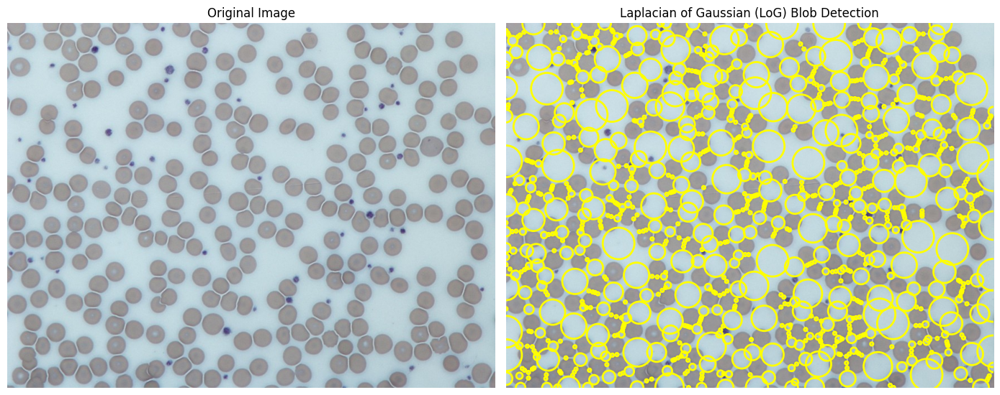

Applying Difference of Gaussian (DoG) blob detection...
DoG method detected 637 blobs


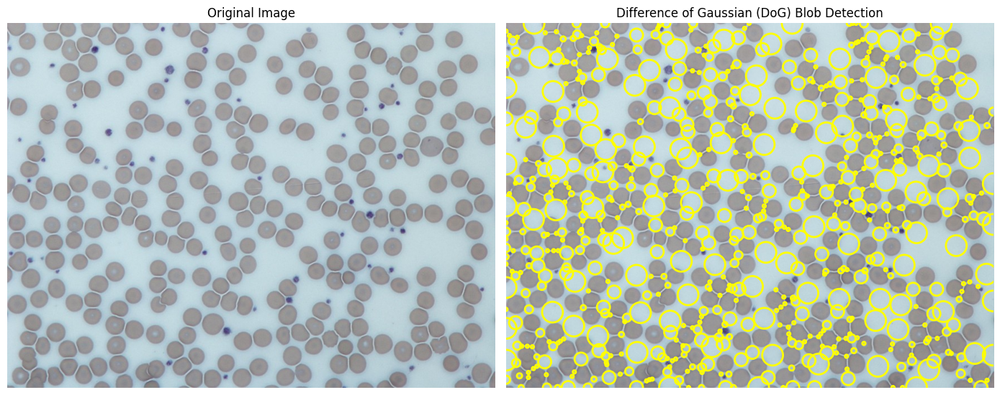

Applying Histogram of Oriented Gradients (HOG) feature detection...
HOG-based method detected 0 blob-like regions


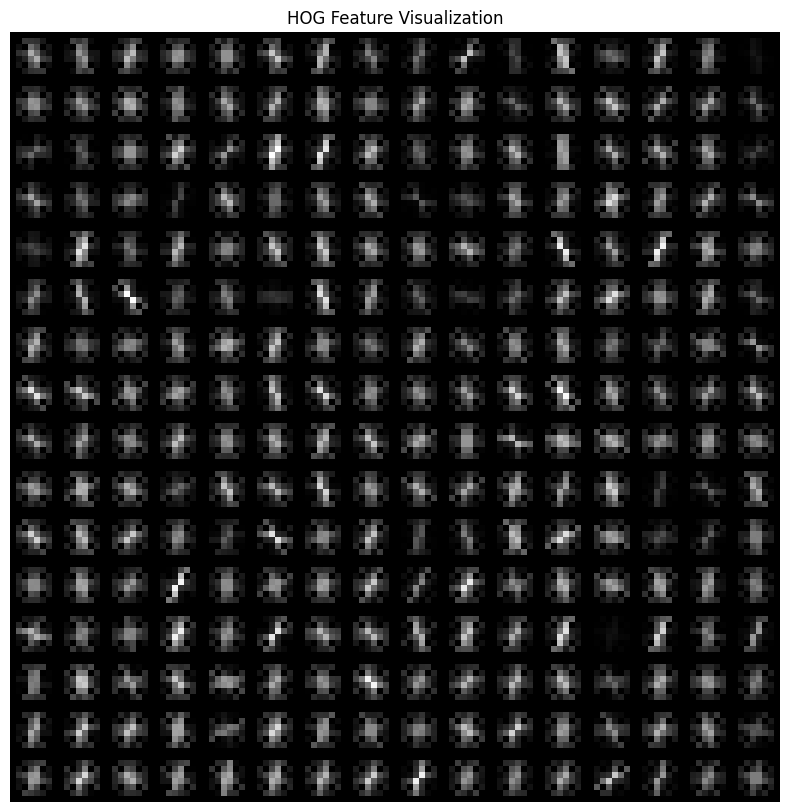

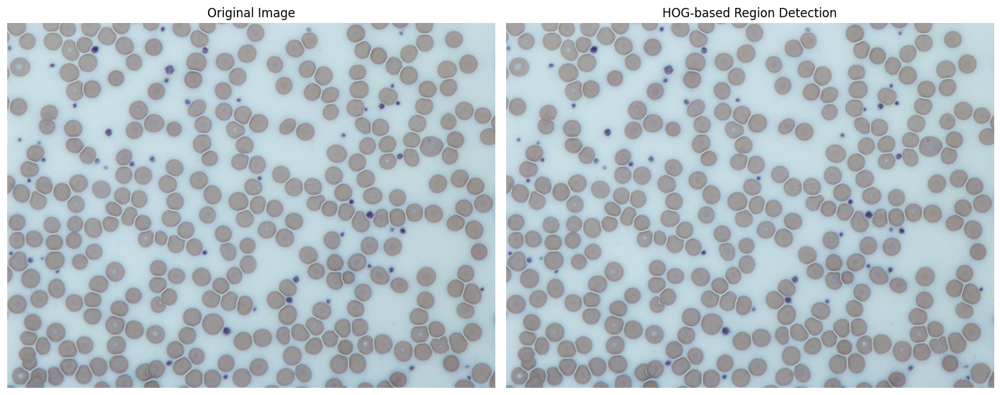

In [31]:
blobs_log = detect_blobs_log(image_rgb, min_sigma=2, max_sigma=20, num_sigma=10, threshold=0.07)
display_results(image_rgb, blobs_log, 'Laplacian of Gaussian (LoG) Blob Detection')

blobs_dog = detect_blobs_dog(image_rgb, min_sigma=2, max_sigma=20, threshold=0.05)
display_results(image_rgb, blobs_dog, 'Difference of Gaussian (DoG) Blob Detection')

blobs_hog, hog_image = detect_features_hog(image_rgb)
if blobs_hog is not None:
    display_results(image_rgb, blobs_hog, 'HOG-based Region Detection')

Detecting platelets by color...
Color-based method detected 25 platelets


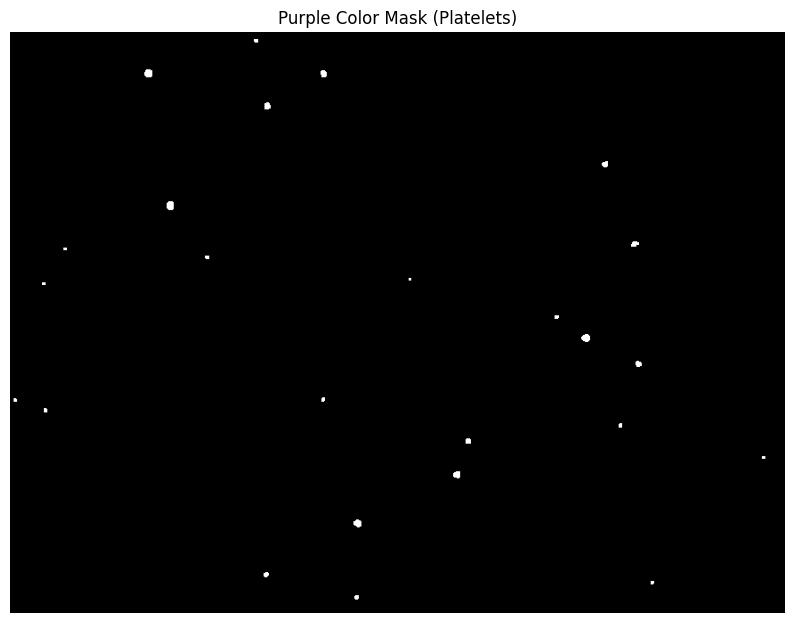

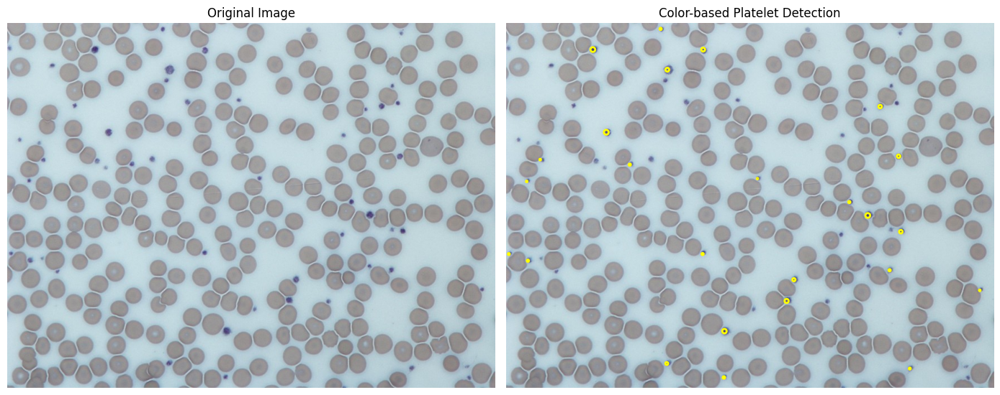

In [32]:
def detect_platelets_by_color(image):
    print("Detecting platelets by color...")
    hsv = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)

    lower_purple = np.array([120, 30, 30])
    upper_purple = np.array([170, 255, 255])

    mask = cv2.inRange(hsv, lower_purple, upper_purple)

    kernel = np.ones((3,3), np.uint8)
    mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel)

    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    platelets = []
    for contour in contours:
        M = cv2.moments(contour)
        if M["m00"] > 0:
            center_x = int(M["m10"] / M["m00"])
            center_y = int(M["m01"] / M["m00"])
            area = cv2.contourArea(contour)
            radius = np.sqrt(area / np.pi)
            if 1 < radius < 10:  # Filter by size
                platelets.append([center_y, center_x, radius])

    platelets = np.array(platelets)
    print(f"Color-based method detected {len(platelets)} platelets")

    plt.figure(figsize=(10, 10))
    plt.imshow(mask, cmap='gray')
    plt.title('Purple Color Mask (Platelets)')
    plt.axis('off')
    plt.show()

    return platelets

platelets = detect_platelets_by_color(image_rgb)
if len(platelets) > 0:
    display_results(image_rgb, platelets, 'Color-based Platelet Detection')

Applying Laplacian of Gaussian for candy detection...
LoG method detected 31 candies


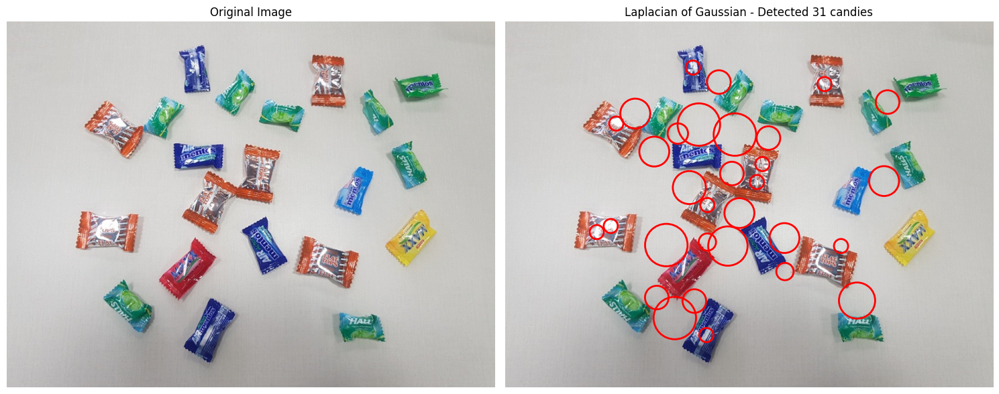

Applying Difference of Gaussian for candy detection...
DoG method detected 95 candies


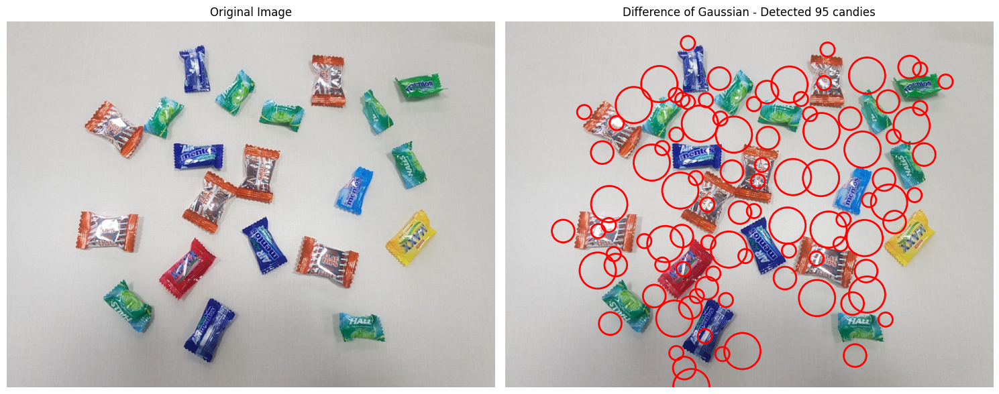

Applying color-based segmentation for candy detection...
Color-based method detected 25 candies


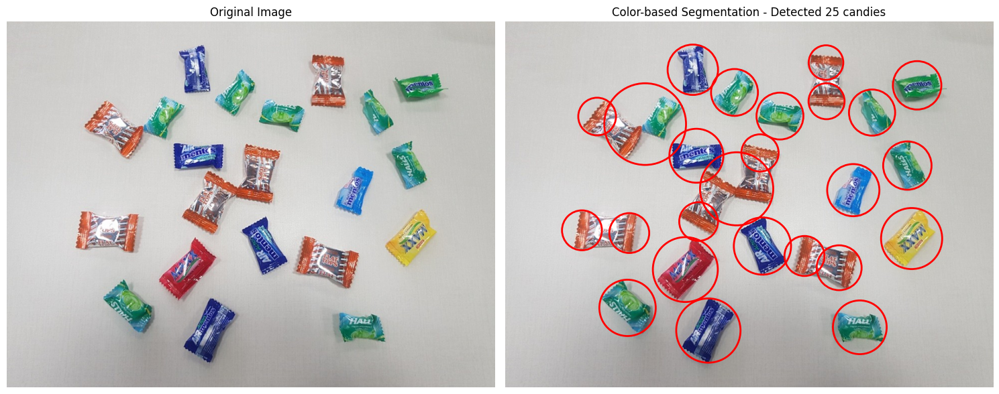

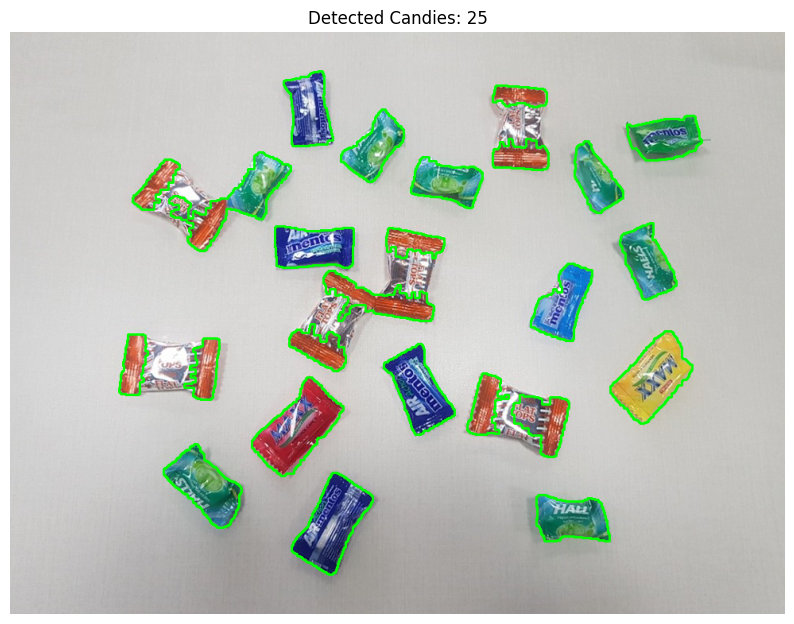

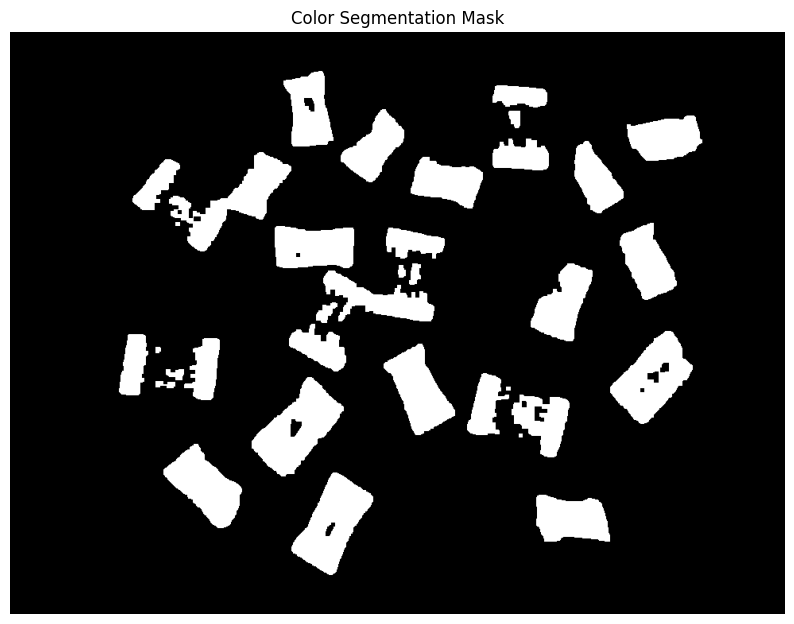


Summary of candy counts by different methods:
LoG Count: 31
DoG Count: 95
Color-based Count: 25
Manual Count: 24


In [33]:
def count_candies(image_path):
    image = cv2.imread(image_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    blurred = cv2.GaussianBlur(gray_image, (5, 5), 0)

    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    enhanced = clahe.apply(blurred)

    def display_results(original, blobs, title):
        fig, ax = plt.subplots(1, 2, figsize=(15, 8))
        ax[0].imshow(original)
        ax[0].set_title('Original Image')
        ax[0].set_axis_off()

        ax[1].imshow(original)
        ax[1].set_title(f'{title} - Detected {len(blobs)} candies')

        for blob in blobs:
            y, x, r = blob
            c = plt.Circle((x, y), r, color='red', linewidth=2, fill=False)
            ax[1].add_patch(c)

        ax[1].set_axis_off()
        plt.tight_layout()
        plt.show()

    print("Applying Laplacian of Gaussian for candy detection...")

    min_sigma = 10
    max_sigma = 30
    num_sigma = 10
    threshold = 0.15

    blobs_log = blob_log(enhanced, min_sigma=min_sigma, max_sigma=max_sigma,
                       num_sigma=num_sigma, threshold=threshold)

    blobs_log[:, 2] = blobs_log[:, 2] * np.sqrt(2)

    print(f"LoG method detected {len(blobs_log)} candies")
    display_results(image_rgb, blobs_log, "Laplacian of Gaussian")

    print("Applying Difference of Gaussian for candy detection...")

    min_sigma = 10
    max_sigma = 30
    sigma_ratio = 1.6
    threshold = 0.05

    blobs_dog = blob_dog(enhanced, min_sigma=min_sigma, max_sigma=max_sigma,
                        sigma_ratio=sigma_ratio, threshold=threshold)

    blobs_dog[:, 2] = blobs_dog[:, 2] * np.sqrt(2)

    print(f"DoG method detected {len(blobs_dog)} candies")
    display_results(image_rgb, blobs_dog, "Difference of Gaussian")

    print("Applying color-based segmentation for candy detection...")

    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    lower_bound = np.array([0, 30, 30])
    upper_bound = np.array([180, 255, 255])

    mask = cv2.inRange(hsv, lower_bound, upper_bound)

    kernel = np.ones((5, 5), np.uint8)
    mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel)
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)

    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    min_area = 500
    max_area = 10000
    filtered_contours = [c for c in contours if min_area < cv2.contourArea(c) < max_area]

    blobs_color = []
    for contour in filtered_contours:
        (x, y), radius = cv2.minEnclosingCircle(contour)
        blobs_color.append([y, x, radius])

    blobs_color = np.array(blobs_color)

    print(f"Color-based method detected {len(blobs_color)} candies")
    display_results(image_rgb, blobs_color, "Color-based Segmentation")

    result = image_rgb.copy()
    cv2.drawContours(result, filtered_contours, -1, (0, 255, 0), 2)

    plt.figure(figsize=(10, 8))
    plt.imshow(result)
    plt.title(f"Detected Candies: {len(filtered_contours)}")
    plt.axis('off')
    plt.show()

    plt.figure(figsize=(10, 8))
    plt.imshow(mask, cmap='gray')
    plt.title("Color Segmentation Mask")
    plt.axis('off')
    plt.show()

    return {
        "LoG Count": len(blobs_log),
        "DoG Count": len(blobs_dog),
        "Color-based Count": len(blobs_color),
        "Manual Count": 24
    }

candy_counts = count_candies("Picture2.jpg")
print("\nSummary of candy counts by different methods:")
for method, count in candy_counts.items():
    print(f"{method}: {count}")

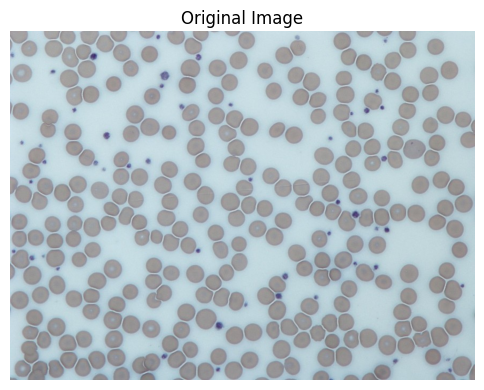

In [6]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def show_img(title, img, cmap=None):
    plt.figure(figsize=(6,6))
    plt.imshow(img, cmap=cmap)
    plt.title(title)
    plt.axis("off")
    plt.show()

image_path = "Picture1.jpg"
img_bgr = cv2.imread(image_path)
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

show_img("Original Image", img_rgb)

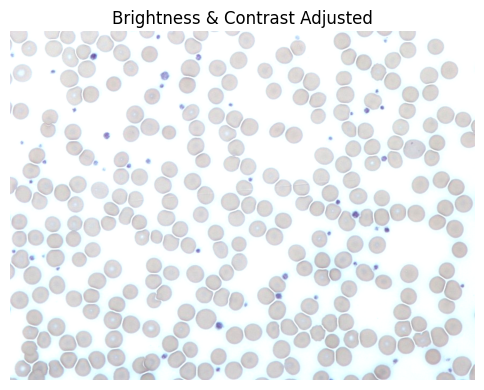

In [7]:
def adjust_brightness_contrast(image, alpha=1.2, beta=30):
    """ alpha: contrast (1.0-3.0), beta: brightness (0-100) """
    adjusted = cv2.convertScaleAbs(image, alpha=alpha, beta=beta)
    return adjusted

bright_contrast_img = adjust_brightness_contrast(img_rgb)
show_img("Brightness & Contrast Adjusted", bright_contrast_img)


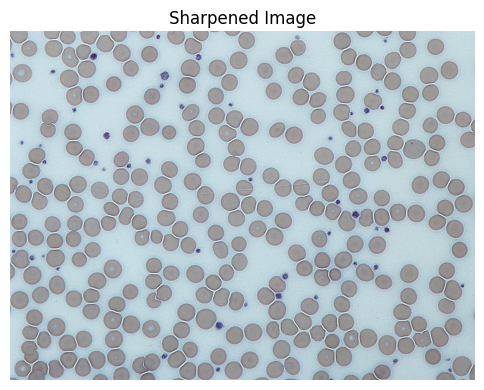

In [8]:
def sharpen_image(image):
    kernel = np.array([[0, -1, 0],
                       [-1, 5,-1],
                       [0, -1, 0]])
    return cv2.filter2D(image, -1, kernel)

sharpened_img = sharpen_image(img_rgb)
show_img("Sharpened Image", sharpened_img)


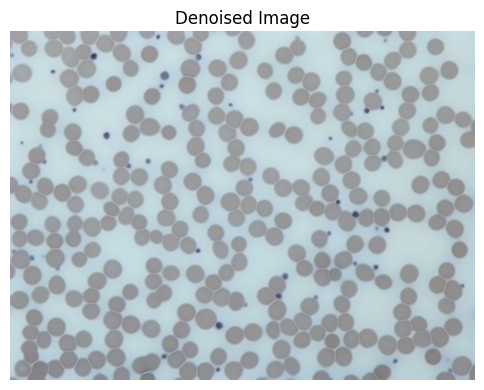

In [9]:
denoised_img = cv2.fastNlMeansDenoisingColored(img_rgb, None, 10, 10, 7, 21)
show_img("Denoised Image", denoised_img)


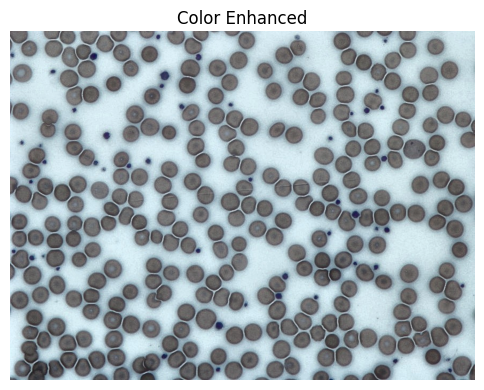

In [10]:
def enhance_color(image):
    lab = cv2.cvtColor(image, cv2.COLOR_RGB2LAB)
    l, a, b = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8, 8))
    cl = clahe.apply(l)
    limg = cv2.merge((cl, a, b))
    return cv2.cvtColor(limg, cv2.COLOR_LAB2RGB)

enhanced_color_img = enhance_color(img_rgb)
show_img("Color Enhanced", enhanced_color_img)


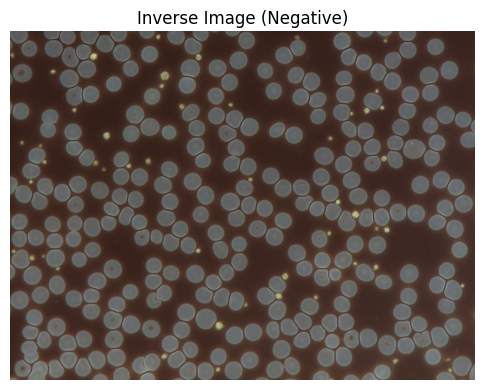

In [11]:
inverse_img = cv2.bitwise_not(img_rgb)
show_img("Inverse Image (Negative)", inverse_img)


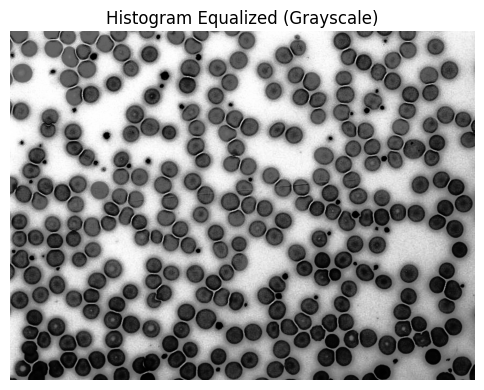

In [12]:
gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)
equalized = cv2.equalizeHist(gray)
show_img("Histogram Equalized (Grayscale)", equalized, cmap="gray")

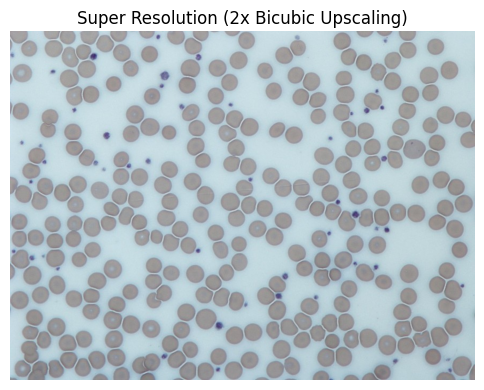

In [13]:
super_res_img = cv2.resize(img_rgb, None, fx=2, fy=2, interpolation=cv2.INTER_CUBIC)
show_img("Super Resolution (2x Bicubic Upscaling)", super_res_img)


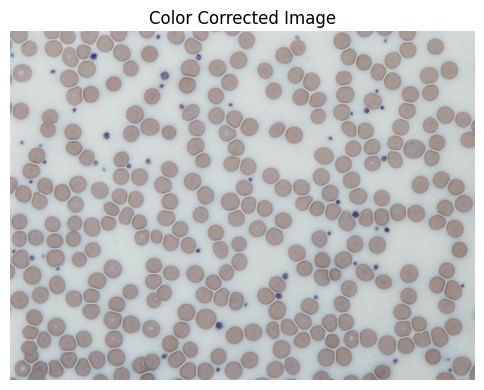

In [14]:
def simple_white_balance(img):
    result = img.copy().astype(np.float32)
    avg_b = np.mean(result[:, :, 0])
    avg_g = np.mean(result[:, :, 1])
    avg_r = np.mean(result[:, :, 2])

    avg_gray = (avg_b + avg_g + avg_r) / 3
    result[:, :, 0] = result[:, :, 0] * (avg_gray / avg_b)
    result[:, :, 1] = result[:, :, 1] * (avg_gray / avg_g)
    result[:, :, 2] = result[:, :, 2] * (avg_gray / avg_r)

    result = np.clip(result, 0, 255).astype(np.uint8)
    return result

color_corrected_img = simple_white_balance(img_rgb)
show_img("Color Corrected Image", color_corrected_img)


In [1]:
!pip install "deeplake<4"

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 640.2/640.2 kB 12.0 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 2.3 MB/s eta 0:00:00
INFO: pip is looking at multiple versions of s3transfer to determine which version is compatible with other requirements. This could take a while.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.3/78.3 kB 7.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.3/139.3 kB 12.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.3/18.3 MB 108.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.0/18.0 MB 62.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 69.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 82.3/82.3 kB 7.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.4/13.4 MB 123.7 MB/s eta 0:00:00
   ━

In [5]:
!pip install torch torchvision

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 112.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 93.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 52.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 13.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 105.2 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling nvidia-nvjitlink-cu12-12.5.82:
      Successfully uninstalled nvidia-nvjitl

In [7]:
!pip install numpy==1.23.5 --force-reinstall

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.1/17.1 MB 82.8 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 1.26.4
    Uninstalling numpy-1.26.4:
      Successfully uninstalled numpy-1.26.4
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
jaxlib 0.5.1 requires numpy>=1.25, but you have numpy 1.23.5 which is incompatible.
imbalanced-learn 0.13.0 requires numpy<3,>=1.24.3, but you have numpy 1.23.5 which is incompatible.
tensorflow 2.18.0 requires numpy<2.1.0,>=1.26.0, but you have numpy 1.23.5 which is incompatible.
scikit-image 0.25.2 requires numpy>=1.24, but you have numpy 1.23.5 which is incompatible.
bigframes 1.42.0 requires numpy>=1.24.0, but you have numpy 1.23.5 which is incompatible.
albumentations 2.0.5 requires numpy>=1.24.4, but you have numpy 1.23.5 which is incompatible.
blosc2 3.3.0 requires numpy>=1.26, but

In [1]:

import torch
import torchvision
import torchvision.transforms as transforms
import torch.nn as nn
import torch.optim as optim
import time
import matplotlib.pyplot as plt

from torchvision.models import resnet18, resnet34
from deeplake import load


/usr/local/lib/python3.11/dist-packages/deeplake/util/check_latest_version.py:32: UserWarning: A newer version of deeplake (4.2.0) is available. It's recommended that you update to the latest version using `pip install -U deeplake`.
  warnings.warn(


In [2]:
import torchvision.datasets as datasets

transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.507, 0.487, 0.441), (0.267, 0.256, 0.276))
])

train_dataset = datasets.CIFAR100(root="./data", train=True, download=True, transform=transform)
test_dataset = datasets.CIFAR100(root="./data", train=False, download=True, transform=transform)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=128, shuffle=True, num_workers=2)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=128, shuffle=False, num_workers=2)

100%|██████████| 169M/169M [00:03<00:00, 48.6MB/s]


In [11]:
def train_model(model, train_loader, criterion, optimizer, device, epochs=5):
    model.train()
    train_loss = []
    for epoch in range(epochs):
        running_loss = 0.0
        for images, labels in train_loader:
            images = images.to(device)
            labels = labels.to(device)

            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()

        avg_loss = running_loss / len(train_loader)
        train_loss.append(avg_loss)
        print(f"Epoch [{epoch+1}/{epochs}] - Loss: {avg_loss:.4f}")
    return train_loss


def evaluate_model(model, test_loader, device):
    model.eval()
    correct = 0
    total = 0
    start_time = time.time()
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    inference_time = time.time() - start_time
    accuracy = 100 * correct / total
    print(f"Accuracy: {accuracy:.2f}%, Inference Time: {inference_time:.2f}s")
    return accuracy, inference_time


In [5]:
import torch

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

Using device: cuda


In [7]:
criterion = nn.CrossEntropyLoss()

In [12]:
resnet18_model = resnet18(weights=None)
resnet18_model.fc = nn.Linear(resnet18_model.fc.in_features, 100)
resnet18_model = resnet18_model.to(device)
optimizer_18 = optim.Adam(resnet18_model.parameters(), lr=0.001)

print("Training ResNet-18...")
loss_18 = train_model(resnet18_model, train_loader, criterion, optimizer_18, device)
acc_18, time_18 = evaluate_model(resnet18_model, test_loader, device)


Training ResNet-18...
Epoch [1/5] - Loss: 3.4827
Epoch [2/5] - Loss: 2.7164
Epoch [3/5] - Loss: 2.3157
Epoch [4/5] - Loss: 2.0137
Epoch [5/5] - Loss: 1.7338
Accuracy: 41.97%, Inference Time: 2.30s


In [13]:
resnet34_model = resnet34(weights=None)
resnet34_model.fc = nn.Linear(resnet34_model.fc.in_features, 100)
resnet34_model = resnet34_model.to(device)
optimizer_34 = optim.Adam(resnet34_model.parameters(), lr=0.001)

print("Training ResNet-34...")
loss_34 = train_model(resnet34_model, train_loader, criterion, optimizer_34, device)
acc_34, time_34 = evaluate_model(resnet34_model, test_loader, device)

Training ResNet-34...
Epoch [1/5] - Loss: 3.6965
Epoch [2/5] - Loss: 2.9216
Epoch [3/5] - Loss: 2.5100
Epoch [4/5] - Loss: 2.2162
Epoch [5/5] - Loss: 1.9625
Accuracy: 38.33%, Inference Time: 2.69s



📈 Model Comparison:
ResNet-18 Accuracy: 41.97%, Time: 2.30s
ResNet-34 Accuracy: 38.33%, Time: 2.69s


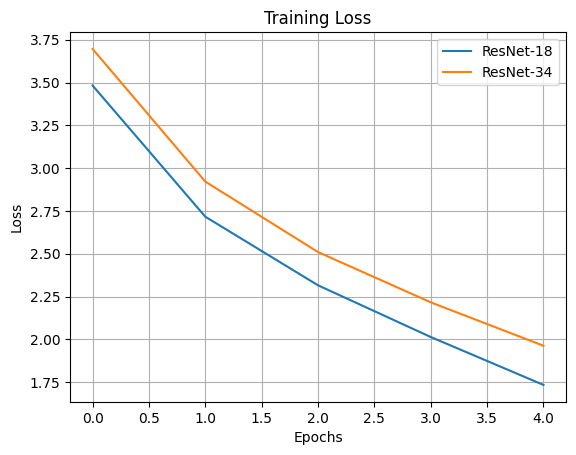

In [14]:

print("\n Model Comparison:")
print(f"ResNet-18 Accuracy: {acc_18:.2f}%, Time: {time_18:.2f}s")
print(f"ResNet-34 Accuracy: {acc_34:.2f}%, Time: {time_34:.2f}s")

plt.plot(loss_18, label='ResNet-18')
plt.plot(loss_34, label='ResNet-34')
plt.title("Training Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()
plt.grid(True)
plt.show()


In [17]:
from torchvision.datasets import MNIST
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader
import random
import torch
import numpy as np
import torchvision

transform = transforms.Compose([
    transforms.ToTensor()
])

mnist_train = MNIST(root='./data', train=True, download=True, transform=transform)

class_indices = {}
for idx, (_, label) in enumerate(mnist_train):
    if label not in class_indices:
        class_indices[label] = []
    class_indices[label].append(idx)


100%|██████████| 9.91M/9.91M [00:00<00:00, 16.1MB/s]
100%|██████████| 28.9k/28.9k [00:00<00:00, 515kB/s]
100%|██████████| 1.65M/1.65M [00:00<00:00, 3.81MB/s]
100%|██████████| 4.54k/4.54k [00:00<00:00, 10.1MB/s]


In [18]:
class SiameseDataset(Dataset):
    def __init__(self, dataset, class_indices):
        self.dataset = dataset
        self.class_indices = class_indices
        self.classes = list(class_indices.keys())

    def __getitem__(self, index):
        img1, label1 = self.dataset[index]
        if random.random() < 0.5:
            same_class = label1
            img2 = self.dataset[random.choice(self.class_indices[same_class])][0]
            label = 1.0
        else:
            diff_class = random.choice([c for c in self.classes if c != label1])
            img2 = self.dataset[random.choice(self.class_indices[diff_class])][0]
            label = 0.0

        return (img1, img2), torch.tensor([label], dtype=torch.float32)

    def __len__(self):
        return len(self.dataset)


In [19]:
import torch.nn as nn
import torch.nn.functional as F

class SiameseNetwork(nn.Module):
    def __init__(self):
        super(SiameseNetwork, self).__init__()
        self.cnn = nn.Sequential(
            nn.Conv2d(1, 64, 3), nn.ReLU(),
            nn.MaxPool2d(2, 2),
            nn.Conv2d(64, 128, 3), nn.ReLU(),
            nn.MaxPool2d(2, 2),
        )
        self.fc = nn.Sequential(
            nn.Linear(128 * 5 * 5, 256),
            nn.ReLU(),
            nn.Linear(256, 128)
        )

    def forward_once(self, x):
        x = self.cnn(x)
        x = x.view(x.size()[0], -1)
        x = self.fc(x)
        return x

    def forward(self, x1, x2):
        out1 = self.forward_once(x1)
        out2 = self.forward_once(x2)
        return out1, out2


In [20]:
class ContrastiveLoss(nn.Module):
    def __init__(self, margin=2.0):
        super(ContrastiveLoss, self).__init__()
        self.margin = margin

    def forward(self, out1, out2, label):
        euclidean_distance = F.pairwise_distance(out1, out2)
        loss = torch.mean(
            label * torch.pow(euclidean_distance, 2) +
            (1 - label) * torch.pow(torch.clamp(self.margin - euclidean_distance, min=0.0), 2)
        )
        return loss


In [21]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

train_dataset = SiameseDataset(mnist_train, class_indices)
train_loader = DataLoader(train_dataset, shuffle=True, batch_size=64)

model = SiameseNetwork().to(device)
criterion = ContrastiveLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

for epoch in range(5):
    total_loss = 0
    for (img1, img2), labels in train_loader:
        img1, img2, labels = img1.to(device), img2.to(device), labels.to(device)

        out1, out2 = model(img1, img2)
        loss = criterion(out1, out2, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_loss += loss.item()
    print(f"Epoch [{epoch+1}/5], Loss: {total_loss:.4f}")


Epoch [1/5], Loss: 969.6245
Epoch [2/5], Loss: 958.3543
Epoch [3/5], Loss: 955.2301
Epoch [4/5], Loss: 954.8505
Epoch [5/5], Loss: 954.2101


In [22]:
euclidean_distances = []
true_labels = []

for (img1, img2), labels in train_loader:
    img1, img2, labels = img1.to(device), img2.to(device), labels.to(device)

    out1, out2 = model(img1, img2)
    euclidean_distance = torch.pairwise_distance(out1, out2)
    euclidean_distances.append(euclidean_distance.cpu().detach().numpy())
    true_labels.append(labels.cpu().detach().numpy())

euclidean_distances = np.concatenate(euclidean_distances)
true_labels = np.concatenate(true_labels)

predictions = (euclidean_distances < 0.5).astype(int)

accuracy = np.mean(predictions == true_labels) * 100
print(f"Final Accuracy: {accuracy:.2f}%")

Final Accuracy: 50.25%
